# Introduction
---

**I'm a data science student and as part of my final data science project, I thought it would be interesting to find out if there is any relationship between
KFC outlets and the property valuations of the surrounding area.**

If we were to discover a relationship between the location of the KFC outlets and property valuations, KFC could use this analysis to determine where their next outlet should be. 
On the other hand, KFC's competitors could possibly use this analysis to discover under-serviced neigbourhoods and gain an competitive advantage by opening an outlet there, before KFC does.

We will be using publicly available datasets to determine the outcome.

**Data sources**:

* **Property valuations per neighbourhood**  
https://web1.capetown.gov.za/web1/OpenDataPortal/DatasetDetail?DatasetName=Valuations%20property%20bands  
  
    *Our primary dataset and provides the name of each suburb, along with the the number of properties per price band*  
---
* **Official planning suburbs**  
https://web1.capetown.gov.za/web1/opendataportal/DatasetDetail?DatasetName=Official%20planning%20suburbs  

    *Utilised for mapping, providing us the geographic borders of each neighbourhood*  
---
* **Foursquare location data**  
https://developer.foursquare.com/docs/places-api/  

    *The api used to locate the various KFC outlets across the region*  
---


### Data preperation

**Importing required libraries**

In [1]:
import pandas as pd
import random 
import numpy as np 
import matplotlib.pyplot as plt 
from sklearn.cluster import KMeans 
%matplotlib inline
from sklearn import preprocessing

**Fetching suburb csv data**

In [2]:
!wget -O properties_suburbs_value.csv https://datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud/data_asset/Number_of_properties_by_suburb_and_value_band_1_xlsx_99dcfdyzqfkrmrzx7j7y8zhpl
df = pd.read_excel('properties_suburbs_value.csv', skiprows=1,skipfooter=1)

--2020-05-03 19:47:16--  https://datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud/data_asset/Number_of_properties_by_suburb_and_value_band_1_xlsx_99dcfdyzqfkrmrzx7j7y8zhpl
Resolving datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud (datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud)... 169.46.118.98
Connecting to datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud (datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud)|169.46.118.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 101264 (99K) [application/octet-stream]
Saving to: ‘properties_suburbs_value.csv’

100%[======================================>] 101,264     --.-K/s   in 0.001s  

2020-05-03 19:47:16 (80.0 MB/s) - ‘properties_suburbs_value.csv’ saved [101264/101264]



**Renaming the total column**

In [3]:
df.rename(columns={"Unnamed: 37": "Total"}, inplace=True)
df.tail()

,Suburbs,0-200k,2-400k,4-600k,6-800k,800k-1M,1-1.5M,1.5-2M,2-2.5M,2.5-3M,...,60-70M,70-80M,80-90M,90-100M,100-200M,200-300M,300-400M,400-500M,>500M,Total
763,ZEVENWACHT MALL,3.0,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,7
764,ZEVENWACHT RETIREMENT VILLAGE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
765,ZEVENZICHT,5.0,NaN,NaN,2.0,2.0,40.0,78.0,23.0,11.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,164
766,ZONNEBLOEM,605.0,84.0,191.0,740.0,366.0,292.0,113.0,44.0,15.0,...,1.0,NaN,1.0,1.0,3.0,NaN,NaN,NaN,1.0,2638
767,ZOO PARK,2.0,1.0,NaN,53.0,240.0,82.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,382


**Add zeros to non-numeric fields and using only property valuations up until R50,000,000 in order to target residential properties**

In [4]:
df.fillna(0, inplace=True)
cols = df.columns[:-11]
X = df[cols]
X.head()

,Suburbs,0-200k,2-400k,4-600k,6-800k,800k-1M,1-1.5M,1.5-2M,2-2.5M,2.5-3M,...,8-9M,9-10M,10-15M,15-20M,20-25M,25-30M,30-35M,35-40M,40-45M,45-50M
0,ACACIA PARK,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,ADMIRALS PARK,8.0,27.0,50.0,207.0,94.0,60.0,3.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,ADRIAANSE,8.0,11.0,377.0,3.0,2.0,5.0,2.0,1.0,0.0,...,1.0,0.0,1.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0
3,AIRPORT CITY,8.0,1.0,7.0,16.0,13.0,15.0,9.0,9.0,7.0,...,3.0,1.0,12.0,10.0,4.0,1.0,0.0,0.0,0.0,0.0
4,AMANDA GLEN - Bellville,9.0,0.0,6.0,5.0,78.0,24.0,58.0,36.0,6.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**Setting up price tiers, in South African Rand**

In [5]:
priceTiers = {'0-200k': 100000, '2-400k': 300000, '4-600k': 500000, '6-800k': 700000, '800k-1M': 900000, '1-1.5M': 1250000,
             '1.5-2M': 1750000, '2-2.5M': 2250000, '2.5-3M': 2750000, '3.5-4M': 3750000, '4.5-5M': 4750000,
             '5-6M': 5500000, '6-7M': 6500000, '7-8M': 7500000, '8-9M': 8500000, '9-10M': 9500000, '10-15M': 12500000, '15-20M': 17500000, '20-25M': 22500000,
             '25-30M': 27500000, '30-35M': 32500000, '35-40M': 37500000, '40-45M': 42500000, '45-50M': 47500000}
priceTiers

{'0-200k': 100000,
 '2-400k': 300000,
 '4-600k': 500000,
 '6-800k': 700000,
 '800k-1M': 900000,
 '1-1.5M': 1250000,
 '1.5-2M': 1750000,
 '2-2.5M': 2250000,
 '2.5-3M': 2750000,
 '3.5-4M': 3750000,
 '4.5-5M': 4750000,
 '5-6M': 5500000,
 '6-7M': 6500000,
 '7-8M': 7500000,
 '8-9M': 8500000,
 '9-10M': 9500000,
 '10-15M': 12500000,
 '15-20M': 17500000,
 '20-25M': 22500000,
 '25-30M': 27500000,
 '30-35M': 32500000,
 '35-40M': 37500000,
 '40-45M': 42500000,
 '45-50M': 47500000}

**Fetching geo location boundaries of areas in the Western Cape**

In [6]:
import json
    
!wget -O pbdmsuburbs_geo_data.json https://datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud/data_asset/pbdmsuburbs_geojson_8wdc6kkf4ckybjwjumodqy0e6
geo_values = open("pbdmsuburbs_geo_data.json", "rb").read()
suburbs_geo_json = json.loads(geo_values)


--2020-05-03 19:47:30--  https://datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud/data_asset/pbdmsuburbs_geojson_8wdc6kkf4ckybjwjumodqy0e6
Resolving datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud (datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud)... 169.46.118.98
Connecting to datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud (datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud)|169.46.118.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7740857 (7.4M) [application/octet-stream]
Saving to: ‘pbdmsuburbs_geo_data.json’

100%[======================================>] 7,740,857   44.5MB/s   in 0.2s   

2020-05-03 19:47:31 (44.5 MB/s) - ‘pbdmsuburbs_geo_data.json’ saved [7740857/7740857]



In [7]:
!pip install area

  Stored in directory: /home/dsxuser/.cache/pip/wheels/66/c0/12/b2ef12e07a617ba6f7aaeb32348ea6f14205cc1985f51a134e
Successfully built area


In [8]:
from area import area
import geojson
import json

**Renaming suburbs in primary dataset to match the suburbs in the geo location dataset**

In [9]:
lookup = X['Suburbs'].isin(["BEL'AIRE"])
if (X.loc[lookup].shape[0] > 0):
    X.loc[lookup,'Suburbs'] = 'BELL AIR'

    
lookup = X['Suburbs'].isin(["CROYDON OLIVE ESTATE"])
if (X.loc[lookup].shape[0] > 0):
    X.loc[lookup,'Suburbs'] = 'OLIVE ESTATE'    
    
lookup = X['Suburbs'].isin(["CROYDON VINEYARD ESTATE"])
if (X.loc[lookup].shape[0] > 0):
    X.loc[lookup,'Suburbs'] = 'VINEYARD ESTATE' 
    
lookup = X['Suburbs'].isin(["VREDELUST KUILS RIVER"])
if (X.loc[lookup].shape[0] > 0):
    X.loc[lookup,'Suburbs'] = 'VREDELUST KUIL RIVER' 

/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [10]:
X['Suburbs'] = X['Suburbs'].apply(lambda x: x.upper())

notUsed = []
foundItems = dict()
for town in suburbs_geo_json['features']:
    town['properties']['name'] = town['properties']['name'].upper()
    lookup = X['Suburbs'].isin([town['properties']['name']])
    if (X.loc[lookup].shape[0] > 0):
        town['area'] = area(town['geometry'])
        foundItems[town['properties']['name']] = town
    else:    
        notUsed.append(town['properties']['name'])

print('Geo locations available, but not required for report', notUsed)

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


Geo locations available, but not required for report ['KHAYELITSHA', 'AIRPORT', 'ENDLOVINI INFORMAL SETTLEMENT', 'ROBBEN ISLAND', 'WOLFGAT NATURE RESERVE', 'B.H.M', 'CPUT']


**Uppercase suburb names and find suburbs without geometry**

In [11]:
suburb_geo_features = pd.DataFrame.from_dict(foundItems, orient='index')
suburb_geo_features.reset_index(inplace=True)
suburb_geo_features.rename(columns={"index": "Suburbs"}, inplace=True)
suburb_geo_features['Suburbs'] = suburb_geo_features['Suburbs'].apply(lambda x: x.upper())
suburb_geo_features.drop(['type', 'properties'], axis=1, inplace=True)
suburb_geo_features.head()

suburb_geo_features['Suburbs'].describe()

count           766
unique          766
top       KAAPZICHT
freq              1
Name: Suburbs, dtype: object

In [12]:
with_geo = X.merge(suburb_geo_features, how='left', left_on='Suburbs', right_on='Suburbs')
with_geo[with_geo['geometry'].isna()]

,Suburbs,0-200k,2-400k,4-600k,6-800k,800k-1M,1-1.5M,1.5-2M,2-2.5M,2.5-3M,...,10-15M,15-20M,20-25M,25-30M,30-35M,35-40M,40-45M,45-50M,geometry,area
294,HARMONY VILLAGE,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,NaN,NaN
305,HELDERBERG RURAL,4.0,1.0,1.0,0.0,2.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN


**Drop two rows no geo information**

In [13]:
with_geo = X.merge(suburb_geo_features, how='left', left_on='Suburbs', right_on='Suburbs')

na_items = with_geo['geometry'].isna()
to_be_removed = with_geo[na_items]
print(to_be_removed[['Suburbs']])
with_geo.drop(with_geo[na_items].index, inplace=True)

print('Items removed:', len(with_geo[with_geo['geometry'].isna()]) == 0)

              Suburbs
294   HARMONY VILLAGE
305  HELDERBERG RURAL
Items removed: True


**Total the property valuations by neighbourhood**

In [14]:
price_tier_keys = list(priceTiers.keys())


def area_total(suburb_row):
    total = 0
    for price_tier in price_tier_keys:
        total += suburb_row[price_tier] * priceTiers.get(price_tier)
    return total    
        
with_geo['area_total'] = with_geo[price_tier_keys].apply(lambda x: area_total(x), axis=1)


zero_area_total = with_geo[with_geo.area_total == 0]
to_be_removed = zero_area_total
print('Zero area items to be removed',to_be_removed[['Suburbs']])
with_geo.drop(to_be_removed.index, inplace=True)


zero_area_total = with_geo[with_geo.area_total == 0]
zero_area_total.head()
print('Zero sized area items removed:', len(zero_area_total) == 0)

Zero area items to be removed                         Suburbs
64   BELLVILLE TEACHERS COLLEGE
471          NIEUW MAASTRECHT-2
586                   SAXONWOOD
754              WP SHOWGROUNDS
Zero sized area items removed: True


### Key point - devide the total valuation of the neighbourhood, by the area of the neighbourhood

In [17]:
with_geo['area_value_per_sqm'] = with_geo['area_total'] / with_geo['area']
with_geo[['Suburbs','area_value_per_sqm']].head()

,Suburbs,area_value_per_sqm
0,ACACIA PARK,1.201762e+01
1,ADMIRALS PARK,8.135281e+10
2,ADRIAANSE,7.991971e+02
3,AIRPORT CITY,8.324949e+02
4,AMANDA GLEN - BELLVILLE,1.339854e+03


**Sort by area value per square meter**

In [19]:
cloro = with_geo[['Suburbs', 'area_value_per_sqm']]
cloro.sort_values(by=['area_value_per_sqm'], ascending=False, inplace=True)
cloro.head()

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


,Suburbs,area_value_per_sqm
1,ADMIRALS PARK,8.135281e+10
616,SOMERSET WEST,7.554762e+09
499,PAARL FARMS,6.054260e+08
648,STRAND,7.309378e+04
453,MOUILLE POINT,2.132304e+04


In [21]:
!pip install folium

### In the following section we'll focus on finding and removing outliers

{'whiskers': [<matplotlib.lines.Line2D at 0x7feed76d2ba8>,
 'caps': [<matplotlib.lines.Line2D at 0x7feed76e6278>,
 'boxes': [<matplotlib.lines.Line2D at 0x7feed76d2a58>],
 'medians': [<matplotlib.lines.Line2D at 0x7feed76e6908>],
 'fliers': [<matplotlib.lines.Line2D at 0x7feed76e6c50>],
 'means': []}

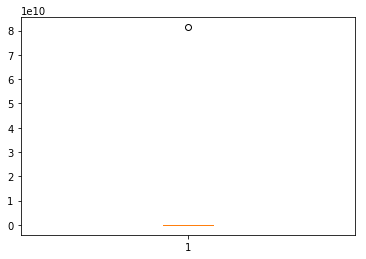

In [22]:
import folium
from folium import plugins
import math
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline  
plt.boxplot(cloro['area_value_per_sqm'].quantile([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]))

**From the plots above and below, we can identify that we have a few outliers in the dataset**

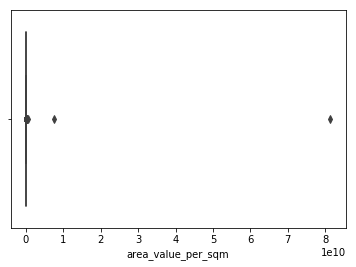

In [23]:
import seaborn as sns
sns.boxplot(x=cloro['area_value_per_sqm'])

In [24]:
from scipy import stats
import numpy as np
z = np.abs(stats.zscore(cloro['area_value_per_sqm']))

In [25]:
Q1 = cloro.quantile(0.25)
Q3 = cloro.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

area_value_per_sqm    806.223404
dtype: float64


**First interation, removing outliers**

In [26]:
outliers = cloro[z > 3]
without_outliers = cloro[z < 3]

print(outliers.head())
without_outliers.head()

         Suburbs  area_value_per_sqm
1  ADMIRALS PARK        8.135281e+10


,Suburbs,area_value_per_sqm
616,SOMERSET WEST,7.554762e+09
499,PAARL FARMS,6.054260e+08
648,STRAND,7.309378e+04
453,MOUILLE POINT,2.132304e+04
26,BANTRY BAY,1.653255e+04


**Check whether there is a need to further reduce outliers**

{'whiskers': [<matplotlib.lines.Line2D at 0x7feed6f19b38>,
 'caps': [<matplotlib.lines.Line2D at 0x7feed6f23208>,
 'boxes': [<matplotlib.lines.Line2D at 0x7feed6f199e8>],
 'medians': [<matplotlib.lines.Line2D at 0x7feed6f23898>],
 'fliers': [<matplotlib.lines.Line2D at 0x7feed6f23be0>],
 'means': []}

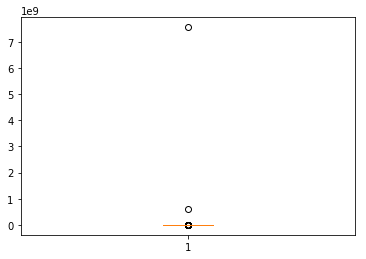

In [27]:
plt.boxplot(without_outliers['area_value_per_sqm'])


**Remove the more outliers, until we see an improved distribution**

           Suburbs  area_value_per_sqm
616  SOMERSET WEST        7.554762e+09
499    PAARL FARMS        6.054260e+08


{'whiskers': [<matplotlib.lines.Line2D at 0x7feed6f03278>,
 'caps': [<matplotlib.lines.Line2D at 0x7feed6f03908>,
 'boxes': [<matplotlib.lines.Line2D at 0x7feed6f03128>],
 'medians': [<matplotlib.lines.Line2D at 0x7feed6f03f98>],
 'fliers': [<matplotlib.lines.Line2D at 0x7feed6f0d320>],
 'means': []}

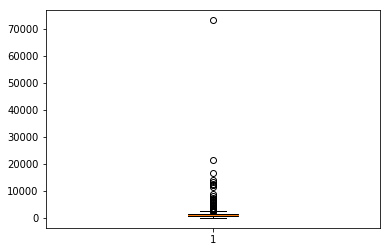

In [28]:
z2 = np.abs(stats.zscore(without_outliers['area_value_per_sqm']))

outliers_reduced = without_outliers[z2 > 0.5]
minus_outliers = without_outliers[z2 < 0.5]

print(outliers_reduced.head())

plt.boxplot(minus_outliers['area_value_per_sqm'])


**We are seeing a better distributon, so there is no need to further reduce outliers**

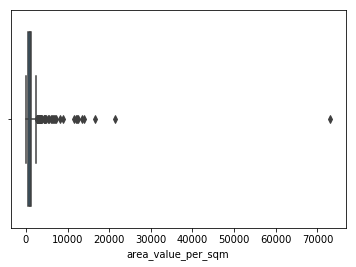

In [30]:
sns.boxplot(x=minus_outliers['area_value_per_sqm'])

In [31]:
minus_outliers.shape

(759, 2)

### Use K-Means Clustering to split the data into 6 groups

In [43]:
k_means3 = KMeans(init = "k-means++", n_clusters = 6, n_init = 1000, max_iter = 1000)
k_means3.fit(minus_outliers[['area_value_per_sqm']])

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=1000,
    n_clusters=6, n_init=1000, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

**Adding a classification column to identify each group**

In [44]:
classified = minus_outliers.copy()
classified['classification'] = k_means3.labels_

#reverse colors such that darker color reflect dense zones
strand_loc = classified['Suburbs'].isin(['STRAND'])
strand_classification = classified[strand_loc]['classification']

if strand_classification.values[0] > 2:
     classified['classification'] = 5 - classified['classification']

classified.head()

,Suburbs,area_value_per_sqm,classification
648,STRAND,73093.775350,2
453,MOUILLE POINT,21323.038658,1
26,BANTRY BAY,16532.546993,1
148,CLIFTON,13938.476195,1
560,ROSEDALE,13368.557644,1


**We are using a csv file instead, to protect my Foursquare api key - method to create the csv below**

In [45]:
!wget -O kfc_location_data.csv https://datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud/data_asset/kfc_locations_csv_9et2airkleanlowa35yte7s39.csv
kfc_location_data_df = pd.read_csv('kfc_location_data.csv')

#### To prevent repeat api calls - saved result to csv - code to generate csv below ###
# import time
# kfc_venues_foursquare = []
# client_id = ''
# client_secret = ''
# url_tpl = 'https://api.foursquare.com/v2/venues/search?query=kfc&limit=50&client_id={0}&client_secret={1}&v=20200501&intent=browse&radius=100000&ll={2}'

# for spot_location in spot_areas:
#     print(spot_location)
#     url = url_tpl.format(client_id, client_secret, spot_location)
#     json_result = pd.read_json(url)
#     json_result.loc['venues'].response
#     kfc_venues_foursquare.append(json_result.loc['venues'].response)
#     time.sleep(1)
    
# places = {}
# for spot_call in kfc_venues_foursquare:
#     for spot_result in spot_call:
#        places[spot_result['id']] = spot_result
    
# kfc_locations = []
# for p in places:
#     val = places[p]
#     if (val.get('location')):
#         kfc_locations.append("{0},{1}".format(val['location']['lat'], val['location']['lng']))

# kfc_locations_df = pd.DataFrame(kfc_locations) 
# kfc_locations_df.rename(columns={0: "lat_lng"}, inplace=True)
# kfc_locations_csv = kfc_locations_df.to_csv(index=False) 

--2020-05-03 20:10:47--  https://datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud/data_asset/kfc_locations_csv_9et2airkleanlowa35yte7s39.csv
Resolving datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud (datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud)... 169.46.118.98
Connecting to datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud (datasciencecatalog-datacatalog-hkuk2s3di.s3.us-south.cloud-object-storage.appdomain.cloud)|169.46.118.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3134 (3.1K) [application/octet-stream]
Saving to: ‘kfc_location_data.csv’

100%[======================================>] 3,134       --.-K/s   in 0s      

2020-05-03 20:10:47 (220 MB/s) - ‘kfc_location_data.csv’ saved [3134/3134]



### Using a choropleth map to visually present the data and using MarkerCluster to cluster together the KFC locations

In [46]:
latitude = -33.966556
longitude = 18.524390

wc_map = folium.Map(location = [latitude, longitude], zoom_start = 11)
geo_str = str(geo_values, 'utf-8')

threshold_scale = np.linspace(classified['classification'].min(),
                              classified['classification'].max(),
                              6, dtype=int)

threshold_scale = threshold_scale.tolist() # change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # make sure that the last value of the list is greater than the maximum immigration

# generate choropleth map using the total immigration
wc_map.choropleth(
    geo_data=geo_str,
    data=classified,
    columns=['Suburbs', 'classification'],
    key_on='feature.properties.name',
    fill_color='PuBu', 
    threshold_scale=threshold_scale,
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Western Cape Area Value Per Square Meter',
    reset=True
)

wc_kfc_places = kfc_location_data_df['lat_lng'].values
kfc_feature_group = folium.map.FeatureGroup()
kfc_outside_evaluation_area = ['-33.4647,18.7286', '-33.641,19.0027', '-33.651951,19.003076', '-33.6305,19.4339', '-34.41124,19.179146', '-33.803598,19.8602242', '-33.3623923,19.315352', '-33.083,18.0376']


# un-clustered
# for kfc_lat_lng in wc_kfc_places:
#     if kfc_lat_lng in kfc_outside_evaluation_area:
#         continue
#     kfc_loc = kfc_lat_lng.split(',')
#     kfc_feature_group.add_child(
#         folium.CircleMarker(
#             [kfc_loc[0], kfc_loc[1]],
#             radius=5, # define how big you want the circle markers to be
#             color='yellow',
#             fill=True,
#             fill_color='blue',
#             fill_opacity=0.6,
#             popup=kfc_lat_lng
#         )
#     )

# wc_map.add_child(kfc_feature_group)
# wc_map


# clustered
kfc_clustered = plugins.MarkerCluster().add_to(wc_map)
for kfc_lat_lng in wc_kfc_places:
    if kfc_lat_lng in kfc_outside_evaluation_area:
        continue
    kfc_loc = kfc_lat_lng.split(',')

    folium.CircleMarker(
            [kfc_loc[0], kfc_loc[1]],
            radius=5, # define how big you want the circle markers to be
            color='yellow',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6,
            popup=kfc_lat_lng
    ).add_to(kfc_clustered)
    

# display map
wc_map

/opt/conda/envs/Python36/lib/python3.6/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning
